# Business Case 2

Group members:
- Lorenzo Pigozzi	--- m20200745
- Nguyen Huy Phuc	--- m20200566
- Ema Mandura	  --- m20200647


## Hotel Chain C

**Overview**\
The objective of the project is to provide an algorithm able to predict if a customer will cancell his booking. 
For further informations about the business context or dataset provided, check the context folder available on GitHub.\
The metadata is available here : https://github.com/joaopfonseca/business-cases/tree/master/BC2_predicting_cancellations

<a class="anchor" id="0.1"></a>
# **Table of Contents**

1.	[Importing data and libraries](#1)   
2.	[Exploratory data analysis (EDA)](#2)       
3.	[Data preprocessing](#3)  
4.  [Modeling](#4)      
5.  [Assessment](#5)
6.  [Profiling of the classes](#6)

# 1. Importing data and libraries <a class="anchor" id="1"></a>

In [60]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
import phik

# sklearn
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, recall_score
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.base import BaseEstimator
from sklearn.model_selection import GridSearchCV

# supervised algorithms
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_graphviz
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression

#encoders
import category_encoders as ce
from category_encoders import TargetEncoder
import category_encoders.utils as util

# visualizations
import plotly.graph_objects as go
import graphviz

In [61]:
df = pd.read_csv('data/H2.csv')

# 2. Exploratory data analysis (EDA) <a class="anchor" id="2"></a>

In [62]:
def countplot_all(df, columns):
    #Prepare figure layout
    rows = int(math.ceil(columns.shape[0]/5))
    sns.set_style("whitegrid")
    fig, axes = plt.subplots(nrows = rows, ncols=5, figsize=(15,3*rows))

    # Draw the boxplots
    for i in zip(axes.flatten(), columns):
        sns.countplot(x=df.loc[:,i[1]], ax=i[0])      
        i[0].set_title(i[1])
        i[0].set_ylabel("")
        i[0].set_xlabel("")
        for tick in i[0].get_xticklabels():
            tick.set_rotation(-25)
    # Finalize the plot
    plt.subplots_adjust(wspace=0.5,hspace = 0.5)
    fig.suptitle("Count plots", fontsize=25)
    #sns.despine(bottom=True)
    plt.show()


def corrheatmap(dataframe, method = "pearson"):
    sns.set(style="white")
    # Compute the correlation matrix
    if method == "phik":
        corr = dataframe.phik_matrix()
    else:
        corr = dataframe.corr(method= method)

    # Generate a mask for the upper triangle
    mask = np.zeros_like(corr, dtype=np.bool) #Return an array of zeros (Falses) with the same shape and type as a given array
    mask[np.triu_indices_from(mask)] = True #The upper-triangle array is now composed by True values
    
    # Set up the matplotlib figure
    fig, ax = plt.subplots(figsize=(20, 16))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True) #Make a diverging palette between two HUSL colors. Return a matplotlib colormap object.

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True,annot=True, linewidths=.5,vmin = -1, vmax = 1, ax=ax)

    # Layout
    plt.subplots_adjust(top=0.95)
    plt.suptitle("Correlation matrix", fontsize=15)
    plt.yticks(rotation=0, fontsize = 14)
    plt.xticks(rotation=-45, fontsize = 14)
    # Fixing the bug of partially cut-off bottom and top cells
    b, t = plt.ylim() # discover the values for bottom and top
    b += 0.5 # Add 0.5 to the bottom
    t -= 0.5 # Subtract 0.5 from the top
    plt.ylim(b, t) # update the ylim(bottom, top) values

    plt.show()        

    
def boxplot_withoutLabels(df):
    plot_features = df.columns
    #Prepare figure layout
    rows = int(math.ceil(df.shape[1]/8))
    sns.set(style="whitegrid")
    fig, axes = plt.subplots(nrows = rows, ncols=8, figsize=(16,4*rows))

    # Draw the boxplots
    for i in zip(axes.flatten(), plot_features):
        sns.boxplot(y=df.loc[:,i[1]], ax=i[0])      
        i[0].set_title(i[1])
        i[0].set_ylabel("")
        for tick in i[0].get_xticklabels():
            tick.set_rotation(-25)

    # Finalize the plot
    plt.subplots_adjust(wspace=2,hspace = 0.5)
    fig.suptitle("Box plots", fontsize=25)
    #sns.despine(bottom=True)
    plt.show()

In [63]:
df.iloc[:,25:]

,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
0,Transient,0.00,0,0,Check-Out,2015-07-03
1,Transient,76.50,0,1,Canceled,2015-07-01
2,Transient,68.00,0,1,Canceled,2015-04-30
3,Transient,76.50,0,2,Canceled,2015-06-23
4,Transient,76.50,0,1,Canceled,2015-04-02
...,...,...,...,...,...,...
79325,Transient,96.14,0,0,Check-Out,2017-09-06
79326,Transient,225.43,0,2,Check-Out,2017-09-07
79327,Transient,157.71,0,4,Check-Out,2017-09-07
79328,Transient,104.40,0,0,Check-Out,2017-09-07


In [64]:
print('Number of observation in the dataset: ', df.shape[0])
print('Number of observation in the dataset: ', df.shape[1])

Number of observation in the dataset:  79330
Number of observation in the dataset:  31


In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79330 entries, 0 to 79329
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   IsCanceled                   79330 non-null  int64  
 1   LeadTime                     79330 non-null  int64  
 2   ArrivalDateYear              79330 non-null  int64  
 3   ArrivalDateMonth             79330 non-null  object 
 4   ArrivalDateWeekNumber        79330 non-null  int64  
 5   ArrivalDateDayOfMonth        79330 non-null  int64  
 6   StaysInWeekendNights         79330 non-null  int64  
 7   StaysInWeekNights            79330 non-null  int64  
 8   Adults                       79330 non-null  int64  
 9   Children                     79326 non-null  float64
 10  Babies                       79330 non-null  int64  
 11  Meal                         79330 non-null  object 
 12  Country                      79306 non-null  object 
 13  MarketSegment   

In [66]:
# defining metric and categorical features
metric_feats = df.loc[:,df.dtypes != "O"].columns.drop('IsCanceled')
cat_feats = df.loc[:,df.dtypes == "O"].columns
target = 'IsCanceled'

In [67]:
# missing values check
df.isna().sum()

IsCanceled                      0
LeadTime                        0
ArrivalDateYear                 0
ArrivalDateMonth                0
ArrivalDateWeekNumber           0
ArrivalDateDayOfMonth           0
StaysInWeekendNights            0
StaysInWeekNights               0
Adults                          0
Children                        4
Babies                          0
Meal                            0
Country                        24
MarketSegment                   0
DistributionChannel             0
IsRepeatedGuest                 0
PreviousCancellations           0
PreviousBookingsNotCanceled     0
ReservedRoomType                0
AssignedRoomType                0
BookingChanges                  0
DepositType                     0
Agent                           0
Company                         0
DaysInWaitingList               0
CustomerType                    0
ADR                             0
RequiredCarParkingSpaces        0
TotalOfSpecialRequests          0
ReservationSta

In [68]:
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IsCanceled,79330,NaN,NaN,NaN,0.41727,0.493111,0,0,0,1,1
LeadTime,79330,NaN,NaN,NaN,109.736,110.949,0,23,74,163,629
ArrivalDateYear,79330,NaN,NaN,NaN,2016.17,0.699181,2015,2016,2016,2017,2017
ArrivalDateMonth,79330,12,August,8983,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ArrivalDateWeekNumber,79330,NaN,NaN,NaN,27.1774,13.3985,1,17,27,38,53
ArrivalDateDayOfMonth,79330,NaN,NaN,NaN,15.7866,8.72845,1,8,16,23,31
StaysInWeekendNights,79330,NaN,NaN,NaN,0.795185,0.885026,0,0,1,2,16
StaysInWeekNights,79330,NaN,NaN,NaN,2.18296,1.45642,0,1,2,3,41
Adults,79330,NaN,NaN,NaN,1.85098,0.509292,0,2,2,2,4
Children,79326,NaN,NaN,NaN,0.0913698,0.372177,0,0,0,0,3


In [69]:
# Checking duplicated observations
df.loc[df.duplicated(keep=False), :]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
8,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
9,1,62,2015,July,27,2,2,3,2,0.0,...,No Deposit,8,NULL,0,Transient,76.50,0,1,No-Show,2015-07-02
10,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
12,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
17,0,43,2015,July,27,3,0,2,2,0.0,...,No Deposit,1,NULL,0,Transient-Party,86.00,0,0,Check-Out,2015-07-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79292,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79293,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79294,0,63,2017,August,35,31,0,3,3,0.0,...,No Deposit,9,NULL,0,Transient-Party,195.33,0,2,Check-Out,2017-09-03
79312,0,175,2017,August,35,31,1,3,1,0.0,...,No Deposit,42,NULL,0,Transient,82.35,0,1,Check-Out,2017-09-04


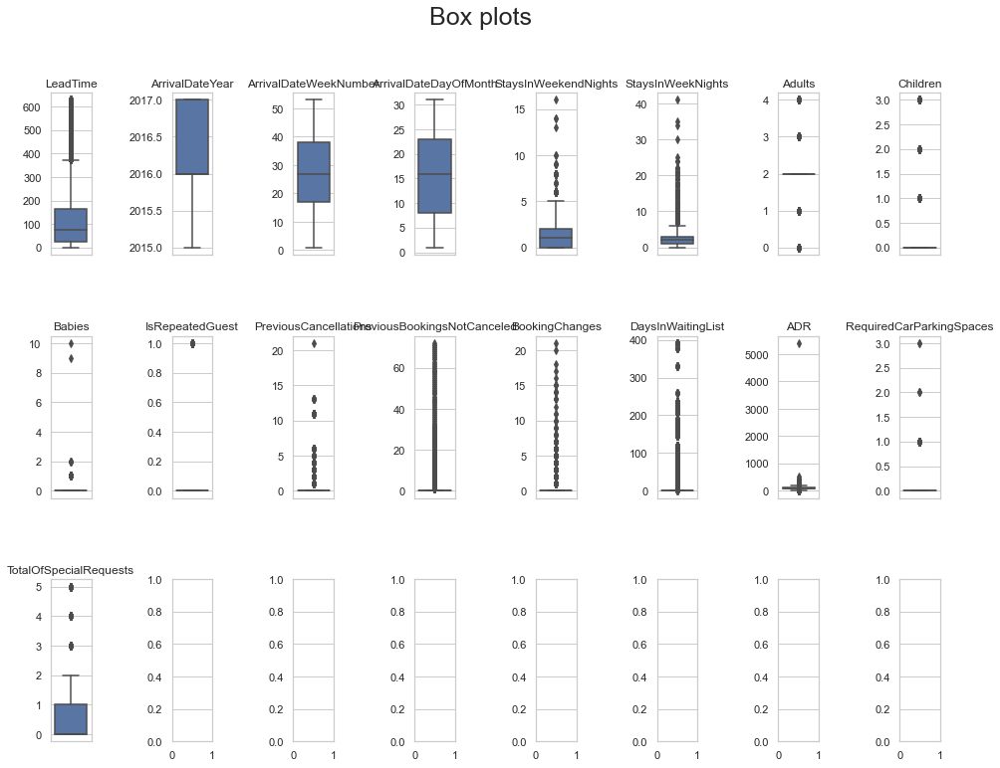

In [70]:
# checking the distributions of the metric features
boxplot_withoutLabels(df[metric_feats])

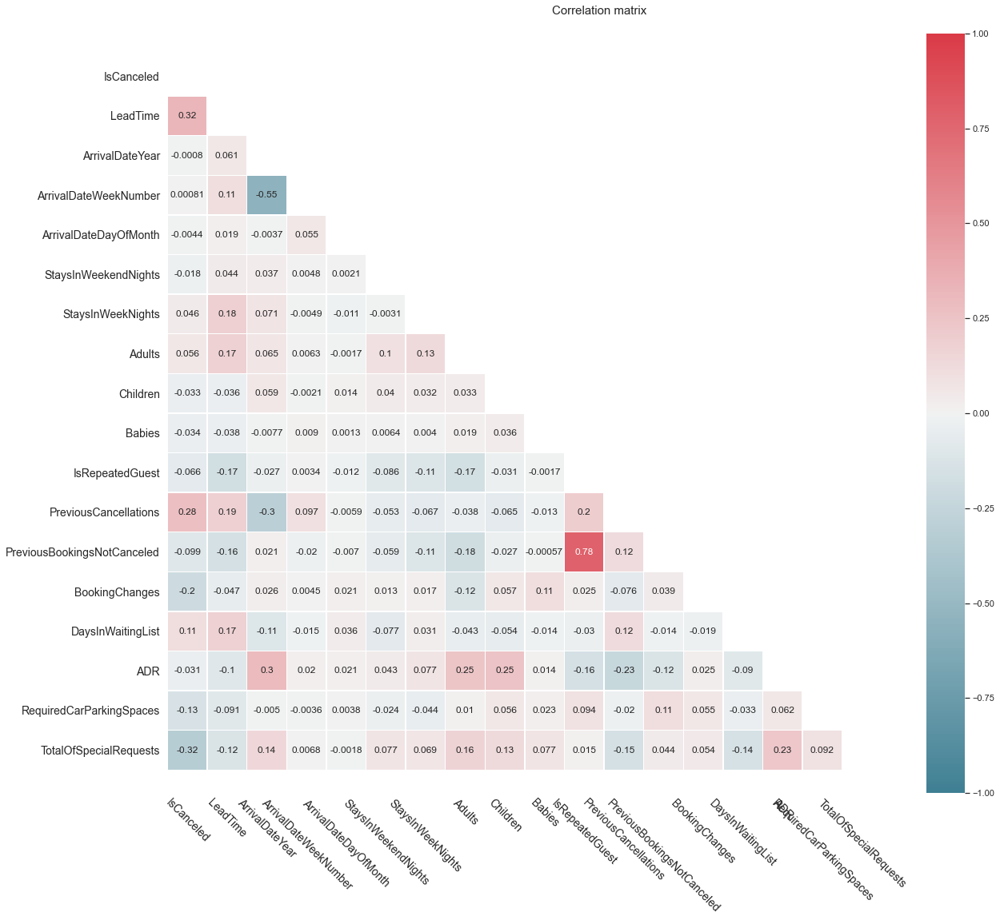

In [71]:
# checking the correlations among the numerical features
corrheatmap(df, method = 'spearman')

In [72]:
#checking no sense values
df[(df['Adults'] == 0) & (df['Children'] == 0)]

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,...,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
332,0,132,2015,July,30,23,2,5,0,0.0,...,No Deposit,1,NULL,0,Transient-Party,0.00,0,0,Check-Out,2015-07-30
862,0,0,2015,August,33,9,2,0,0,0.0,...,No Deposit,9,NULL,0,Contract,0.00,0,0,Check-Out,2015-08-11
960,0,0,2015,August,33,10,9,20,0,0.0,...,No Deposit,NULL,47,0,Transient,0.00,0,0,Check-Out,2015-09-08
996,0,0,2015,August,33,11,0,4,0,0.0,...,No Deposit,NULL,49,0,Transient-Party,0.00,0,1,Check-Out,2015-08-15
2392,1,1,2015,September,37,6,2,0,0,0.0,...,No Deposit,1,NULL,0,Transient-Party,0.00,0,0,Canceled,2015-09-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74969,0,107,2017,June,26,27,0,3,0,0.0,...,No Deposit,7,NULL,0,Transient,100.80,0,0,Check-Out,2017-06-30
75031,0,1,2017,June,26,30,0,1,0,0.0,...,No Deposit,NULL,NULL,0,Transient,0.00,1,1,Check-Out,2017-07-01
76191,0,44,2017,July,28,15,1,1,0,0.0,...,No Deposit,425,NULL,0,Transient,73.80,0,0,Check-Out,2017-07-17
76474,0,2,2017,July,28,15,2,5,0,0.0,...,No Deposit,9,NULL,0,Transient-Party,22.86,0,1,Check-Out,2017-07-22


**Notes:**
- Iscancelled is the target variable
- there are only a few NaNs in the variables Children and Country
- there are many duplicated rows in the data. Nevertheless, it was specified by the company that it's a coincidence, they're not duplicated customersr
- no relevant correlations detected among the metric features
- data may contain outliers

# 3. Data preprocessing <a class="anchor" id="3"></a>

### 3.1. Data Cleaning

In [73]:
# dropping rows based on no sense value check
df = df[~(df['Adults'] == 0) | ~(df['Children'] == 0)]

In [74]:
# dropping missing values for the variable Children (4 observations)
df = df[~df['Children'].isna()]
df = df[~df['Country'].isna()]

**Notes**\
Dropping variables: 
- ArrivalDateYear : it's not useful for a prediction, because the goal is to predict the next customers
- ReservationStatus : it's possible to store this information only when the customer arrives
- ReservationStatusDate : other variables are more relevant and repeat info (ex. LeadTime)
- Babies : the majority of the customers has the same value (0 --> more than 95 %)
- DepositType : this variable is incorrect

In [75]:
# dropping variables
# variables not relevant for the prediction purpose
df.drop(columns=['ArrivalDateYear', 'ReservationStatus', 'ReservationStatusDate', 'Babies','DepositType'], inplace=True)

In [76]:
# updating metric and categorical features
metric_feats = df.loc[:,df.dtypes != "O"].columns.drop('IsCanceled')
cat_feats = df.loc[:,df.dtypes == "O"].columns

### 3.2. Outliers

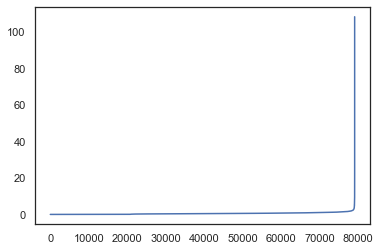

In [18]:
# computing the DBSCAN for outliers

# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=10)
data = pd.DataFrame(RobustScaler().fit_transform(df[metric_feats]), columns=df[metric_feats].columns, index = df.index)
neigh.fit(data)
distances, _ = neigh.kneighbors(data)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [19]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=4, min_samples=80, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df[metric_feats])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 36


C:\Users\lorep\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='count'>

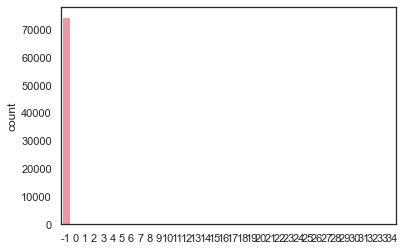

In [20]:
# Concatenating the labels to df
sns.countplot(dbscan_labels)

In [21]:
# the observations identified as outliers are the ones with labels = -1 
# dispaying the outliers detected
print('Number of outliers detected by DBSCAN :', np.sum(dbscan_labels == -1))

Number of outliers detected by DBSCAN : 74492


We tried to use the unsupervised DBSCAN algorithm to detect the outliers. Hower, the input space seems to be not the most adeguate for this kind of detection. The number of outliers detected is too high.

In [77]:
# manual outliers remotion
# based on the boxplots previously analysed in the EDA, we remove only 1 observation
df = df[(df['ADR'] < 4000)]

# 4. Modeling <a class="anchor" id="4"></a>

In [47]:
# splitting the dataset
X = df.drop(['IsCanceled'], axis=1)
Y = df['IsCanceled']

X_train, X_test, y_train, y_test = train_test_split( X, Y,
                                                    train_size = 0.90, 
                                                    shuffle = True, 
                                                    stratify = Y)

X, Y = X_train, y_train

X_train, X_validation, y_train, y_validation = train_test_split( X, Y,
                                                    train_size = 0.85, 
                                                    shuffle = True, 
                                                    stratify = Y)

In [48]:
## Encoding categorical features
# Initia the encoder model
GLMMEncoder = ce.glmm.GLMMEncoder(verbose =0 ,binomial_target=False)
# fit the train data
GLMMEncoder.fit(X_train[cat_feats],y_train)
# transform training set
X_train[cat_feats] = GLMMEncoder.transform(X_train[cat_feats])

X_validation[cat_feats] = GLMMEncoder.transform(X_validation[cat_feats])
# transform test set
X_test[cat_feats] = GLMMEncoder.transform(X_test[cat_feats])

C:\Users\lorep\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
C:\Users\lorep\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [49]:
# Standardization of the variables with the robust scaler
scaler = RobustScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns, index = X_train.index)
X_validation_scaled = pd.DataFrame(scaler.transform(X_validation), columns=X_validation.columns, index = X_validation.index)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns, index = X_test.index)

X_train, X_validation, X_test = X_train_scaled, X_validation_scaled, X_test_scaled

In [50]:
# random forest
random_forest = RandomForestClassifier(min_samples_leaf=1, min_samples_split= 4, n_estimators = 100)
random_forest.fit(X_train, y_train)
y_prediction = random_forest.predict(X_validation)  
RF_score = round(recall_score(y_validation, y_prediction), 3)

In [51]:
# decision tree
decision_tree = DecisionTreeClassifier() 
decision_tree.fit(X_train, y_train)  
y_prediction = decision_tree.predict(X_validation)  
DT_score = round(recall_score(y_validation, y_prediction), 3)

In [52]:
# gradient boosting 
gb_model = GradientBoostingClassifier()
gb_model.fit(X_train, y_train)
y_prediction = gb_model.predict(X_validation)  
GB_score = round(recall_score(y_validation, y_prediction), 3)

In [52]:
results = pd.DataFrame({'Model': ['Random Forest', 'Decision Tree', 'Gradient Boosting'],'Score': [RF_score, DT_score, GB_score]})
result_df = results.sort_values(by='Score', ascending=False).set_index('Score')
result_df

,Model
Score,
0.836,Random Forest
0.825,Decision Tree
0.780,Gradient Boosting


### Tuning the parameters

In [50]:
# # computing the grid search for the Random Forest
# model = RandomForestClassifier()
# parameters= { 'n_estimators' : [50, 100],
#               'min_samples_split': [2, 4, 6],
#               'min_samples_leaf': [1, 3]}

# grid = GridSearchCV(model, parameters, cv=10)
# grid.fit(X_train, y_train)
# grid.best_params_

{'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 100}

# 5. Assessment <a class="anchor" id="5"></a>

In [53]:
# calculate the performance of the model on the test set
y_prediction = random_forest.predict(X_test)  

In [54]:
print('Classification Report')
target_names = ['No cancelled', 'Cancelled']
print(classification_report(y_test, y_prediction, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

No cancelled       0.89      0.92      0.90      4609
   Cancelled       0.88      0.83      0.86      3306

    accuracy                           0.88      7915
   macro avg       0.88      0.88      0.88      7915
weighted avg       0.88      0.88      0.88      7915



**Choice of the measure:**\
Considering the business context, the most damaging error is the False Negative, because a customer who will potentially cancel is a probem that really matters for the hotel in terms of revenue.
The marginal loss in terms of revenue due to a cancellation is worse than a gift offered to a customer who will not cancel.
Considering the business needs, thus, it's advisable to focus on the reduction of the false negatives, as much as possible. In order to take it into consideration, the best choice of measure is the Recall, that consider the True positive / false negatives, in particular focused on the prediction of class "IsCancel" = 1. Getting a high recall means reducing the false negatives error.

# 6. Profiling of the classes <a class="anchor" id="6"></a>

In [42]:
x = df['LeadTime']
y = df['ArrivalDateWeekNumber']
color = df['IsCanceled']
size = 5 
z = df['ADR']

data_3d = dict(type='scatter3d',
            x=x, 
            y=y,  
            z=z,
            mode='markers',
            marker=dict(size=size,
                        color=color,
                        colorbar=dict(title=dict(text='Clusters')),
                        colorscale='Viridis',
                        showscale=False,
                        line=dict(width=2,
                                  color='black',
                                  colorscale='inferno' #Not in use here since our line color is fixed!
                                )
                       ),
            name='3D Scatter Visualization',
            showlegend=False
           )


layout_3d = dict(title=dict(text='Wonderful Wine of the World clusters'),
              scene=dict(yaxis=dict(title='ArrivalDateWeekNumber'),
                         xaxis=dict(title='LeadTime'),
                         zaxis=dict(title='ADR')
                        ),
              margin=dict(l=0, r=0, b=10, t=30)
                        
             )

fig_3 = go.Figure(data=data_3d, layout=layout_3d)

fig_3.show()

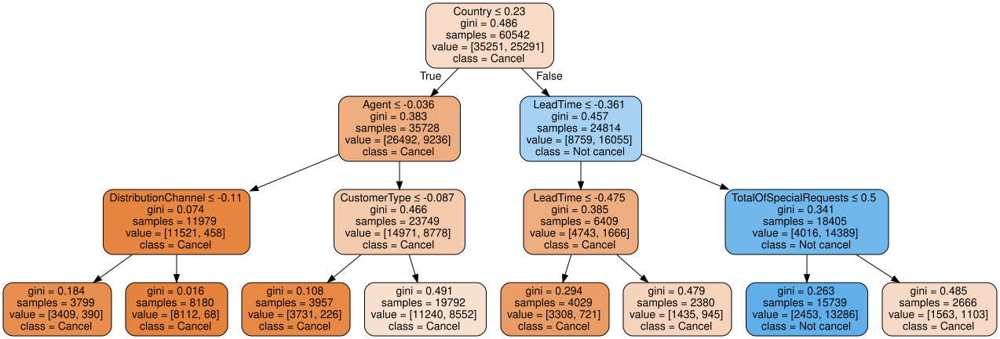

In [48]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(random_state=0, max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

dot_data = export_graphviz(clf, out_file=None, 
                           feature_names=X.columns.to_list(),
                           class_names=["Cancel","Not cancel"],
                           filled=True,
                           rounded=True,
                           special_characters=True)  
# Draw graph
graph = graphviz.Source(dot_data, format="png") 
#graph.render('tree.gv', view=True)  
graph

In [23]:
# profiling the 2 classes by country
main_countries = ['PRT', 'ITA', 'FRA', 'DEU', 'GBR', 'ESP']
df_country = df[df['Country'].isin(main_countries)]

<AxesSubplot:xlabel='Country', ylabel='count'>

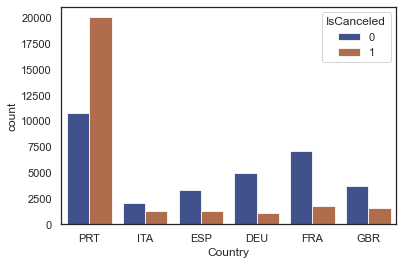

In [27]:
# profiling the 2 classes by country
sns.countplot(data=df_country, 
             x="Country", hue="IsCanceled", alpha =.8,
             palette="dark")

In [55]:
df.columns

Index(['IsCanceled', 'LeadTime', 'ArrivalDateMonth', 'ArrivalDateWeekNumber',
       'ArrivalDateDayOfMonth', 'StaysInWeekendNights', 'StaysInWeekNights',
       'Adults', 'Children', 'Meal', 'Country', 'MarketSegment',
       'DistributionChannel', 'IsRepeatedGuest', 'PreviousCancellations',
       'PreviousBookingsNotCanceled', 'ReservedRoomType', 'AssignedRoomType',
       'BookingChanges', 'Agent', 'Company', 'DaysInWaitingList',
       'CustomerType', 'ADR', 'RequiredCarParkingSpaces',
       'TotalOfSpecialRequests'],
      dtype='object')

<AxesSubplot:xlabel='ArrivalDateMonth', ylabel='count'>

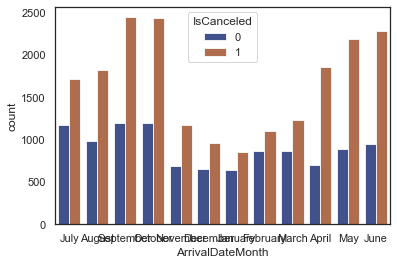

In [56]:
sns.countplot(data=df_portugal, 
             x="ArrivalDateMonth", hue="IsCanceled", alpha =.8,
             palette="dark")

<AxesSubplot:xlabel='ArrivalDateMonth', ylabel='count'>

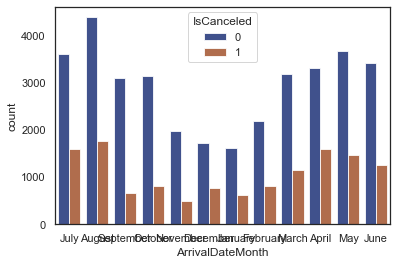

In [57]:
sns.countplot(data=df_world, 
             x="ArrivalDateMonth", hue="IsCanceled", alpha =.8,
             palette="dark")